# Basics of PIL and Image

In [1]:
from PIL import Image, ImageColor, ImageEnhance 
import numpy as np

In [2]:
# create a new image by import
image = Image.open("picture.jpg")

In [3]:
# Alternative way to import an image
with Image.open('picture.jpg') as image:
    image.show()

In [4]:
# create a new image from scratch
image_blank=Image.new('RGBA',size=(1000,1000))
image_blank.show()

##### RGBA
In here you can see we specified the A which is stands for Transparency

In [5]:
# show th Picture
image.show()

In [6]:
#saving the image
image.save('test_save.png')

In [7]:
# image information
print(image.size)

(4000, 3000)


In [8]:
print(image.filename)

/Users/vinayakpawar/Desktop/Work/Computer_Vision_Practice/Practice/picture.jpg


In [9]:
print(image.format)

JPEG


In [10]:
print(image.format_description)

JPEG (ISO 10918)


# Basic Manipulation
#### Rotate, flip, crop, scale
#### Creating a Thumbnail

In [11]:
# Importing an Image
image = Image.open("picture.jpg")

In [12]:
# Documentation
# https://pillow.readthedocs.io/en/stable/?badge=latest

In [13]:
# Rotate the image
image_rotate = image.rotate(60,expand=True,fillcolor=ImageColor.getcolor('red','RGB'))

In [14]:
# If you run below code you will see it returns the tuple of the RGB values
ImageColor.getcolor('red','RGB')

(255, 0, 0)

In [15]:
image_rotate.show()

In [16]:
# Color 
print(ImageColor.colormap)

{'aliceblue': '#f0f8ff', 'antiquewhite': '#faebd7', 'aqua': '#00ffff', 'aquamarine': '#7fffd4', 'azure': '#f0ffff', 'beige': '#f5f5dc', 'bisque': '#ffe4c4', 'black': '#000000', 'blanchedalmond': '#ffebcd', 'blue': '#0000ff', 'blueviolet': '#8a2be2', 'brown': '#a52a2a', 'burlywood': '#deb887', 'cadetblue': '#5f9ea0', 'chartreuse': '#7fff00', 'chocolate': '#d2691e', 'coral': '#ff7f50', 'cornflowerblue': '#6495ed', 'cornsilk': '#fff8dc', 'crimson': '#dc143c', 'cyan': '#00ffff', 'darkblue': '#00008b', 'darkcyan': '#008b8b', 'darkgoldenrod': '#b8860b', 'darkgray': '#a9a9a9', 'darkgrey': '#a9a9a9', 'darkgreen': '#006400', 'darkkhaki': '#bdb76b', 'darkmagenta': '#8b008b', 'darkolivegreen': '#556b2f', 'darkorange': '#ff8c00', 'darkorchid': '#9932cc', 'darkred': '#8b0000', 'darksalmon': '#e9967a', 'darkseagreen': '#8fbc8f', 'darkslateblue': '#483d8b', 'darkslategray': '#2f4f4f', 'darkslategrey': '#2f4f4f', 'darkturquoise': '#00ced1', 'darkviolet': '#9400d3', 'deeppink': '#ff1493', 'deepskyblue'

In [17]:
# cropping the image
#image_crop = image.crop((left_x,top_y,right_x,bottom_y))
image_crop = image.crop((0,0,500,400))

In [18]:
image_crop.show()

In [19]:
# Flipping the Image / Transpose the image
image_flip_horizontal = image.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
image_flip_vertical = image.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
image_transpose = image.transpose(Image.Transpose.TRANSPOSE)

# Other Options: FLIP_LEFT_RIGHT, FLIP_TOP_BOTTOM, ROTATE_90, ROTATE_180, ROTATE_270, TRANSPOSE, TRANSVERSE.

In [20]:
image_flip_horizontal.show()
image_flip_vertical.show()
image_transpose.show()


In [21]:
# Resizing the Image(Below this is the easy way to resize the image but it is not the best way to resize the image because it is prone to error and the aspect ratio of the image will not be maintained)
image_resize=image.resize((600,1000)) # Bad Example

#Better Example

scale_factor = 2
new_image_size = (image.size[0] * scale_factor, image.size[1] * scale_factor)
image_resize_better = image.resize(new_image_size)

## Explaination:

Explanation
scale_factor = 2:

This line sets a variable named scale_factor to 2. This means you want to double the size of the image. The scale factor is a multiplier that determines how much to scale (resize) the image.


new_image_size = (image.size[0] * scale_factor, image.size[1] * scale_factor):

1. image.size: This attribute (typically found in image processing libraries like PIL in Python) returns a tuple representing the width and height of the image. For example, if image.size is (width, height), then image.size[0] is the width, and image.size[1] is the height.
2. image.size[0] * scale_factor: This part of the code multiplies the original width of the image by the scale_factor (which is 2 in this case). If the original width was 100 pixels, the new width will be 100 * 2 = 200 pixels.
3. image.size[1] * scale_factor: Similarly, this multiplies the original height of the image by the scale_factor. If the original height was 50 pixels, the new height will be 50 * 2 = 100 pixels.

The result is a tuple (new_width, new_height) which represents the new dimensions of the image after scaling.

Putting It All Together
If we assume the original image size is 100x50 pixels, the code will work as follows:

a. image.size returns (100, 50).
b. image.size[0] is 100 and image.size[1] is 50.
c. The new width is 100 * 2 = 200 pixels.
d. The new height is 50 * 2 = 100 pixels.
e. So, new_image_size will be (200, 100).

In [22]:
#image_resize.show()
image_resize_better.show()
image_resize_better.save('double_resolution.png')

#  Filters and Enhancements
Pillow can change vibrance, contrast, brightness and sharpness using ImageEnhance

And it can do blur, contour, emboss, sharpening etc using filters (there are a lot of those)

https://pillow.readthedocs.io/en/stable/reference/ImageEnhance.html

In [23]:
from PIL import ImageEnhance

In [24]:
image = Image.open("picture.jpg")

In [25]:
color_enhancer = ImageEnhance.Color(image) # Takes care of the Vibrance of image
contrast_enhancer = ImageEnhance.Contrast(image) # Takes care of the contrast of image
brightness_enhancer = ImageEnhance.Brightness(image) # Takes care of the brightness of image
sharpness_enhancer = ImageEnhance.Sharpness(image) # Takes care of the sharpness of image

In [26]:
contrasted_Image = contrast_enhancer.enhance(2).show()
Brightened_Image = brightness_enhancer.enhance(2).show()
Sharpened_Image= sharpness_enhancer.enhance(2).show()

#### Filter Image

In [27]:
from PIL import ImageFilter

In [28]:
image = Image.open("picture.jpg")

In [29]:
image_blur = image.filter(ImageFilter.BLUR)
image_contour = image.filter(ImageFilter.CONTOUR)
image_detail = image.filter(ImageFilter.DETAIL)
image_edge = image.filter(ImageFilter.EDGE_ENHANCE)
image_edge_more = image.filter(ImageFilter.EDGE_ENHANCE_MORE)
image_find_edges = image.filter(ImageFilter.FIND_EDGES)
image_emboss = image.filter(ImageFilter.EMBOSS)
image_sharp = image.filter(ImageFilter.SHARPEN)
image_smooth = image.filter(ImageFilter.SMOOTH)
image_smooth_more = image.filter(ImageFilter.SMOOTH_MORE)




In [30]:
image_blur.show()
image_contour.show()
image_detail.show()
image_edge.show()
image_edge_more.show()
image_find_edges.show()
image_emboss.show()
image_sharp.show()
image_smooth.show()
image_smooth_more.show()


In [31]:
# Rank Filters
# Min Filter: This filter replaces each pixel with the minimum value from its neighborhood.
# It is useful for enhancing dark regions and reducing pepper noise.
image_filtered_min = image.filter(ImageFilter.MinFilter(size = 5)).show()

# This filter replaces each pixel with the median value from its neighborhood.
# It is commonly used to reduce noise while preserving edges.
image_filtered_median = image.filter(ImageFilter.MedianFilter(size = 5)).show()

# This filter replaces each pixel with the maximum value from its neighborhood.
# It is useful for enhancing bright regions and reducing salt noise.
image_filtered_max = image.filter(ImageFilter.MaxFilter(size = 5)).show()

In [32]:
# MultiBand Filters
# Multiband filters in image processing refer to operations applied to images that have multiple color channels or bands, such as RGB images which consist of red, green, and blue channels. These filters process each band independently or simultaneously, depending on the desired outcome. Multiband filters are essential in tasks like color correction, enhancement, and manipulation, where it's necessary to consider the different color components of the image.

# Key Concepts of Multiband Filters
# Multiple Bands: Images often contain multiple bands (or channels), each representing a different component of the image. For example, an RGB image has three bands: Red, Green, and Blue.
# Independent Processing: Filters can be applied independently to each band. For instance, an edge detection filter might be applied separately to the red, green, and blue channels.
# Combined Processing: Some filters might process the bands together to achieve effects that depend on the interaction between different color components, such as adjusting brightness and contrast.

In [33]:
# MultiBand Filters in Pillow
image_box_blur = image.filter(ImageFilter.BoxBlur(radius = 5)).show()
image_gaussblur = image.filter(ImageFilter.GaussianBlur(radius = 5)).show()
image_unsharp = image.filter(ImageFilter.UnsharpMask(radius = 5)).show()

In [34]:
# Combine filters
# Even after we applied filters on an image, it is still an image object. We can apply multiple filters to an image by chaining them together. This is done by calling the filter() method multiple times on the same image object. The filters are applied in the order they are called.
# Combine filters: blur + emboss
image_emboss = image.filter(ImageFilter.EMBOSS)
image_emboss_blur = image_emboss.filter(ImageFilter.GaussianBlur(radius=2))
image_emboss_blur.show()

# Colors in Pillow image

In [35]:
#Pillow can access and change colors
# It can Also change the format of the image
# Every pixel has a specific color 
# That Color can be expressed in a few different ways
# Combination of (R,G,B) values goes from 0 to 255
# For Printing Jobs (Cyan, Magenta, Yellow) these colors gets used

In [36]:
# Numpy 
#print(np.array(image))

#print(np.array(image.getchannel('R')))

#### Output Explaination
(3000, 4000, 3):
The image has heght of (3000)
The image has width of (4000)
The image has channels of (3) which is R,G,B.


In [37]:
#colors only
print(image.getpixel((0,0))) #this code retrieves the color of the pixel located at the co-ordinates of (0,0) in the image, Top-Left corner of the image, and it will return tupple of RGB Values
print(image.getcolors(maxcolors = image.size[0] * image.size[1])) #maxcolor argument = 256 -> if image has more colors than 256, it will return None


(120, 178, 224)
[(12, (255, 255, 255)), (70, (254, 255, 255)), (112, (252, 255, 255)), (153, (251, 255, 255)), (37, (250, 255, 255)), (180, (249, 255, 255)), (220, (248, 255, 255)), (284, (247, 255, 255)), (137, (246, 255, 255)), (353, (245, 255, 255)), (295, (244, 255, 255)), (199, (243, 255, 255)), (367, (242, 255, 255)), (427, (241, 255, 255)), (391, (240, 255, 255)), (289, (239, 255, 255)), (388, (238, 255, 255)), (447, (237, 255, 255)), (382, (236, 255, 255)), (385, (235, 255, 255)), (322, (234, 255, 255)), (325, (233, 255, 255)), (316, (232, 255, 255)), (407, (231, 255, 255)), (349, (230, 255, 255)), (382, (229, 255, 255)), (353, (228, 255, 255)), (383, (227, 255, 255)), (346, (226, 255, 255)), (327, (225, 255, 255)), (275, (224, 255, 255)), (262, (223, 255, 255)), (303, (222, 255, 255)), (286, (221, 255, 255)), (229, (220, 255, 255)), (262, (219, 255, 255)), (266, (218, 255, 255)), (187, (217, 255, 255)), (193, (216, 255, 255)), (208, (215, 255, 255)), (173, (214, 255, 255)), (1

2. print(image.getcolors(maxcolors = image.size[0] * image.size[1]))

This line of code is active and will be executed. Let's break it down:

image.getcolors(maxcolors = image.size[0] * image.size[1]):

getcolors is a method that returns a list of colors used in the image along with their frequency.
maxcolors:
This argument sets the maximum number of unique colors the method should return.
If the number of unique colors in the image exceeds maxcolors, the method will return None.
image.size:
image.size returns a tuple representing the width and height of the image, like (width, height).
image.size[0] * image.size[1]:
This calculates the total number of pixels in the image (width multiplied by height).
By setting maxcolors to the total number of pixels, you're essentially allowing the method to count every unique color in the image, assuming each pixel could potentially have a different color.
Example Scenario:

If image.size is (100, 100), then image.size[0] * image.size[1] equals 10,000.
This means the getcolors method will check up to 10,000 unique colors in the image.
3. Comment: #maxcolor argument = 256 -> if image has more colors than 256, it will return None

This comment explains what would happen if the maxcolors argument were set to a smaller value, like 256.

maxcolors = 256:
If the image contains more than 256 unique colors, image.getcolors(256) will return None.
This can be useful if you want to quickly check if an image is very colorful or not without getting into too much detail.
Summary
Commented Line: print(image.getpixel((0,0)))
If executed, it would print the color of the top-left pixel of the image.
Active Line: print(image.getcolors(maxcolors = image.size[0] * image.size[1]))
This line prints a list of all unique colors in the image along with their frequencies.
By setting maxcolors to the total number of pixels, it ensures that all unique colors are considered.
If the image contains more unique colors than maxcolors, the method will return None.
This method is useful for understanding the color distribution in an image and can be particularly important in tasks like image compression, analysis, and processing. If you have any more questions or need further clarification, feel free to ask!

In [38]:
# Getting picture information
print(image.mode) # it shows the mode of image sometimes it will be in RGB, 1(Binary), L(GrayScale), P(Paletted), RGBA(True color with ALpha), CMYK(Cyan, Magenta, Yellow, Black), YCbCr (Luminance, Chrominance Blue, Chrominance Red), LAB (Luminance, A Channel, B Channel), HSV (Hue, Saturation, Value), I (32-bit Integer Pixels), F (32-bit Floating Point Pixels) 
print(image.getbands()) # This returns a tuple with the names of the image bands (color channels)
print(image.info)

RGB
('R', 'G', 'B')
{'jfif': 258, 'jfif_version': (1, 2), 'dpi': (72, 72), 'jfif_unit': 1, 'jfif_density': (72, 72), 'progressive': 1, 'progression': 1, 'icc_profile': b'\x00\x00\x0cHLino\x02\x10\x00\x00mntrRGB XYZ \x07\xce\x00\x02\x00\t\x00\x06\x001\x00\x00acspMSFT\x00\x00\x00\x00IEC sRGB\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-HP  \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11cprt\x00\x00\x01P\x00\x00\x003desc\x00\x00\x01\x84\x00\x00\x00lwtpt\x00\x00\x01\xf0\x00\x00\x00\x14bkpt\x00\x00\x02\x04\x00\x00\x00\x14rXYZ\x00\x00\x02\x18\x00\x00\x00\x14gXYZ\x00\x00\x02,\x00\x00\x00\x14bXYZ\x00\x00\x02@\x00\x00\x00\x14dmnd\x00\x00\x02T\x00\x00\x00pdmdd\x00\x00\x02\xc4\x00\x00\x00\x88vued\x00\x00\x03L\x00\x00\x00\x86view\x00\x00\x03\xd4\x00\x00\x00$lumi\x00\x00\x03\xf8\x00\x00\x00\x14meas\x00\x00\x04

#### Explaination of print(image.info)

Breakdown of image.info Dictionary:

jfif: 258:

JFIF (JPEG File Interchange Format) marker.
258 is a marker indicating the presence of the JFIF standard in this JPEG file.

jfif_version: (1, 2):
The version of the JFIF standard used. This indicates JFIF version 1.02.

dpi: (72, 72):
Dots Per Inch. This indicates the resolution of the image, both horizontally and vertically, which is 72 dpi.

jfif_unit: 1:
The unit of measurement for the resolution. 1 indicates that the resolution is in dots per inch.

jfif_density: (72, 72):
The pixel density of the image. This is the same as the dpi value, indicating 72 dpi horizontally and vertically.

progressive: 1 and progression: 1:
These indicate that the image is stored as a progressive JPEG. Progressive JPEGs load in successive waves of detail, becoming clearer as more data is received.

icc_profile:
This is a binary string representing the ICC (International Color Consortium) profile embedded in the image.
ICC profiles are used to manage color consistency across different devices (e.g., monitors, printers).

In [39]:
# Channels
#red_channel = image.getchannel('R') # you can access the RGB Channles in different ways here you can see we are passing the string of channels 'R' for red
#image.getchannel(1) # and here we are giving integers where 0 means Red, 1 means Green, 2 means Blue
#red_channel.show()

## Color Cnversions

In [40]:
# 1 bit grayscale image
image_grayscale_1bit = image.convert('1')
#print(np.array(image_grayscale_1bit))
print(np.array(image_grayscale_1bit, dtype = int))
print(image_grayscale_1bit.getbands())
#image_grayscale_1bit.show()

[[1 0 1 ... 1 1 1]
 [1 1 0 ... 1 0 1]
 [0 1 1 ... 1 1 1]
 ...
 [0 1 0 ... 1 1 1]
 [0 0 1 ... 1 1 1]
 [0 1 0 ... 1 1 1]]
('1',)


print(np.array(image_grayscale_1bit))
Why we got boolean output:

Because, We created a image using 1 bit grayscale. numpy got confused because there is only binary values 0 and 1 bit. and we used 1 bit so it is converting the 0's to flase and 1's to true

print(np.array(image_grayscale_1bit, dtype = int))
for this you can see now numpy given binary integer output. 0 for black pixel and 1 for white pixel

('1',) 
this output given because, there is only 1 band present in the image file.

In [41]:
# 8 bit grayscale (Better kind of Gray scale)
grayscale_l = image.convert('L')  #The L stands for Luminosity (Brightness for Normal People)
print(np.array(grayscale_l))
print(grayscale_l.getbands())
grayscale_l.show()

[[166 166 166 ... 218 218 218]
 [167 167 167 ... 218 218 218]
 [167 167 167 ... 218 218 218]
 ...
 [ 66  73  82 ... 224 237 237]
 [ 68  78  89 ... 222 239 241]
 [ 67  79  92 ... 220 242 246]]
('L',)


here we are using 8 bit colors so you will have 0 to 256 bit colors to work with and the array will be in this range. that's why using 8 bit is recommended because it gives 
lot of information, better quality and versatility(you can use it different applications)

In [42]:
## Palette
#palette = image.convert('P') # using 256 colors only
#print(np.array(palette)) # Output array of this print does not contains the colors, these are only references to the colors in palette
#print(palette.getpalette())
#print(np.array(palette.getpalette()).reshape(256,3))
#palette.show()

by running you will see colored image. using only 256 colors kind of like 8 bit grayscale except it doesn't have gray color rather specific kind of palette we are using

In [43]:
from PIL import Image
import numpy as np

# Load your image
image = Image.open('picture.jpg')

# Convert the image to 'P' mode using an adaptive palette with 16 colors
palette_16 = image.convert('P', palette=Image.ADAPTIVE, colors=16)

# Show the palette image (commented out to avoid the error)
# palette_16.show()

# Print the palette itself to see the colors
palette = palette_16.getpalette()
print("Original palette (flattened):")
print(palette)

# Ensure the palette has exactly 48 values (16 colors * 3 channels)
if len(palette) < 16 * 3:
    # Pad the palette with zeros if it's too short
    palette = palette + [0] * (16 * 3 - len(palette))
elif len(palette) > 16 * 3:
    # Truncate the palette if it's too long
    palette = palette[:16 * 3]

# Convert the palette to a NumPy array and reshape it to (16, 3)
palette_array = np.array(palette).reshape(16, 3)
print("Reshaped palette array (16 colors, RGB):")
print(palette_array)


Original palette (flattened):
[225, 230, 218, 182, 219, 240, 160, 192, 208, 152, 158, 134, 78, 174, 232, 58, 155, 226, 88, 143, 191, 18, 145, 233, 129, 123, 106, 105, 110, 86, 48, 127, 203, 78, 103, 95, 80, 83, 68, 50, 73, 77, 40, 56, 58, 29, 38, 33]
Reshaped palette array (16 colors, RGB):
[[225 230 218]
 [182 219 240]
 [160 192 208]
 [152 158 134]
 [ 78 174 232]
 [ 58 155 226]
 [ 88 143 191]
 [ 18 145 233]
 [129 123 106]
 [105 110  86]
 [ 48 127 203]
 [ 78 103  95]
 [ 80  83  68]
 [ 50  73  77]
 [ 40  56  58]
 [ 29  38  33]]


In [44]:
#Change Individual Pixels
#image.putpixel((100,200),(255,0,0)) # You have to put Two attributes here, Position and color
for x in range(image.size[0]):
    for y in range(image.size[1]):
        if image.getpixel((x,y))[0] > 200:
            image.putpixel((x,y),(0,0,0))
image.show() # By using this you can replace all the pixels who uses Red to display will change into black, and also it is slow so, use Numpy array for this it will make it too quicker.

#### The Below Numpy code is the same as above. It's just done in numpy code.

In [45]:
import numpy as np
from PIL import Image

# Load the image
image = Image.open('picture.jpg')
image_np = np.array(image)

# Change a specific pixel (100, 200) to red
image_np[200, 100] = [255, 0, 0]

# Change all pixels with a red value greater than 200 to black
mask = image_np[:, :, 0] > 200
image_np[mask] = [0, 0, 0]

# Convert the NumPy array back to an image
result_image = Image.fromarray(image_np)
result_image.show()


## ImageOps: Image OPerations

ImageOps works Kind of like a filter
But it can do more

In [46]:
from PIL import Image, ImageOps

image = Image.open("picture.jpg")
image.show()

In [47]:
# Color Changes
image_contrast = ImageOps.autocontrast(image = image, cutoff = 5)
image_inverted = ImageOps.invert(image)
image_solarize = ImageOps.solarize(image = image, threshold = 100) 
image_posterize = ImageOps.posterize(image = image, bits = 1) 
image_grayscale = ImageOps.grayscale(image = image) 
image_equalized = ImageOps.equalize(image = image)
image_colorize = ImageOps.colorize(image = image.convert('L'), black = 'blue', white = 'red')

Explanation:
image.convert('L'):

convert('L'): This method converts the image to grayscale.
'L' stands for luminance. In grayscale images, each pixel represents the light intensity or brightness. The 'L' mode means each pixel is a single value between 0 (black) and 255 (white), instead of three values (RGB) for color images.
When you convert an image to 'L' mode, you're reducing the image to shades of gray, where the brightness of each pixel is kept, but color information is lost.

ImageOps.colorize(image, black, white):
ImageOps.colorize: This function colorizes a grayscale image by mapping the black and white pixels to two specified colors.
Parameters:
image: The grayscale image to be colorized.
black: The color to replace the black parts of the grayscale image. In this case, 'blue'.
white: The color to replace the white parts of the grayscale image. In this case, 'red'.

Putting it all together:
First, image.convert('L') converts the original image to grayscale, creating an image where pixel values range from 0 (black) to 255 (white).
Then, ImageOps.colorize takes this grayscale image and replaces the black parts with blue and the white parts with red. All the grayscale values between black and white are replaced with corresponding shades between blue and red.

Example:
A pixel with a value of 0 (black) in the grayscale image will be colored blue.
A pixel with a value of 255 (white) in the grayscale image will be colored red.
A pixel with a value of 128 (a mid-gray) in the grayscale image will be colored with a blend between blue and red, resulting in a purple-ish color.
This technique can create visually appealing effects by adding colors to a grayscale image based on specified color mappings.

In [48]:
image_colorize.show()

In [49]:
# Dimesnion Changes

image_mirror = ImageOps.mirror(image)
image_flip = ImageOps.flip(image)
image_scale = ImageOps.scale(image = image, factor = 0.4)
image_contain = ImageOps.contain(image = image, size = (500,200)) #width and Length

image_contain.show()


In [50]:
# Adding and Rmoving things
image_border = ImageOps.expand(image = image, border=100, fill = (255,255,0))
image_padded = ImageOps.pad(image = image, size = (2500,1600))
image_fit = ImageOps.fit(image = image, size = (500,500)) # we are cropping the image from center
image_crop = ImageOps.crop(image = image, border = 500)
image_crop.show()

##### We are dealing with 8k Image:
The ImageOps.pad function is designed to pad an image to a specified size while preserving the aspect ratio. This function ensures the image fits within the given size, and if necessary, it adds padding to make it fit. However, the placement of the padding depends on the aspect ratio of the original image compared to the target size.

Explanation of Padding:
Preserve Aspect Ratio: The primary goal is to resize the image while maintaining its aspect ratio. This prevents distortion.
Centering the Image: The image is centered within the target size.
Adding Padding: If the aspect ratio of the original image doesn't match the target size, padding will be added either horizontally or vertically (or both) to fill the target dimensions.
Why Borders Only on the Sides:
If the padding appears only on the left and right (horizontal padding), it means the original image is taller relative to the target aspect ratio. Therefore, the image is resized to match the target height, and horizontal padding is added to fill the target width.

Example:
Original Image Size: 1000x2000 (Width x Height)
Target Size: 2500x1600 (Width x Height)
Aspect Ratios:
Original: 1000/2000 = 0.5
Target: 2500/1600 = 1.5625
Since the original aspect ratio is much smaller (taller image) than the target aspect ratio, the image will be resized to fit the height of 1600 pixels first, and then padding will be added to the sides to reach the width of 2500 pixels.

Illustration:
The image is resized to have a height of 1600 pixels.
The width after resizing will be calculated based on the aspect ratio, which will be smaller than 2500 pixels.
Padding is then added to the left and right sides to make the total width 2500 pixels.
Handling Different Aspect Ratios:
If the aspect ratio of the original image was wider than the target aspect ratio, the padding would be added to the top and bottom instead.

Summary:
The reason why padding appears only on the sides (left and right) is due to the difference in aspect ratios between the original image and the target size. The ImageOps.pad function ensures the image fits within the target dimensions while preserving the original aspect ratio, and any necessary padding is added to fill the remaining space.

## Deform Is a Complex Topic so please Read it Carefully

What is the deform function?
The deform function in the Pillow library is used to apply geometric transformations to an image. This means you can change the shape and position of the image pixels according to a specified transformation map or function.

Key Points:
Geometric Transformation: This involves changing the coordinates of the pixels in the image. For example, you can stretch, warp, or twist parts of the image.
Transformation Map: You provide a map or function that tells the deform function how to move each pixel in the original image to a new position in the transformed image.
How does it work?
Input Image: You start with an image you want to transform.
Mapping Function: You create a function or use a predefined map that specifies how each pixel in the original image should be repositioned in the new image.
Output Image: The result is a new image where each pixel has been moved according to the mapping function.
Example in Simple Terms:
Imagine you have a rubber sheet with a grid drawn on it (this is your image). The deform function is like pressing and pulling on the rubber sheet in different ways to stretch and twist the grid lines. The way you press and pull is defined by the transformation map.

Basic Usage Example:
Let's say we want to apply a simple deformation to an image:

Import the necessary modules:

code:


from PIL import Image
from PIL import ImageTransform

Load an image:
image = Image.open('your_image.jpg')

Define a transformation:
Let's create a simple mapping function that shifts the image pixels by a fixed amount.

def shift_transform(x, y):
    return x + 50, y + 30  # Shift every pixel 50 units to the right and 30 units down

Apply the deformation:

deformed_image = image.transform(image.size, ImageTransform.QuadTransform(shift_transform))

Save or display the result:

deformed_image.show()


Summary:
Deform Function: Moves pixels around based on a map or function.
Transformation Map/Function: Defines how each pixel's position changes.
Result: A new image with the applied geometric transformation.
In essence, the deform function lets you creatively manipulate the structure of your images by defining custom transformations, making it a powerful tool for advanced image processing tasks.

In [51]:
from PIL import Image, ImageOps

class Deformer():
    def getmesh(self,img):
        w,h = img.size
        # Define a shape in the original image
        source_shape=(0,0,0,h,w,h,w,0)
        # Define a Rectangle in the original image
        # target_rect = (0,0,w,h) # Four Points are Left, Right, Top, Bottom, In this variable we want to use top left rectangle so this points are being used.
        target_rect = (0,0,w//2,h)
        # Return all the Shapes
        return [(target_rect,source_shape)]

image = Image.open('picture.jpg')
deform = ImageOps.deform(image,Deformer())
deform.show()

## Image grpah looks like this: (Double click this cell so that you can see the graph in css mode)


Understanding the Coordinates
Coordinate System:

In images, the coordinate system starts at the top-left corner.
The x-axis goes from left to right.
The y-axis goes from top to bottom.
Image Dimensions:

w is the width of the image.
h is the height of the image.
The Points
(0, 0):

Top-Left Corner: This is the coordinate of the top-left corner of the image.
Explanation: Both x and y are 0, meaning it's at the origin point of the image.
(0, h):

Bottom-Left Corner: This is the coordinate of the bottom-left corner of the image.
Explanation: x is 0 (left edge), and y is h (bottom edge).
(w, h):

Bottom-Right Corner: This is the coordinate of the bottom-right corner of the image.
Explanation: x is w (right edge), and y is h (bottom edge).
(w, 0):

Top-Right Corner: This is the coordinate of the top-right corner of the image.
Explanation: x is w (right edge), and y is 0 (top edge).
Visual Representation
Imagine a rectangle with these points marked:

scss
Copy code
(0,0)         (w,0)
   +------------+
   |            |
   |            |
   |            |
   +------------+
(0,h)         (w,h)

Explanation in the Context of the Code
Source Shape: (0, 0, 0, h, w, h, w, 0)
This represents the entire image with the corners in the order of:
Top-left: (0, 0)
Bottom-left: (0, h)
Bottom-right: (w, h)
Top-right: (w, 0)
When you use these points in the source_shape, it tells the program to use the entire image as the shape to transform from.

Summary
(0, 0): Top-left corner
(0, h): Bottom-left corner
(w, h): Bottom-right corner
(w, 0): Top-right corner
These coordinates outline the full rectangle of the image, which is then used in transformation functions to map and deform the image as needed.
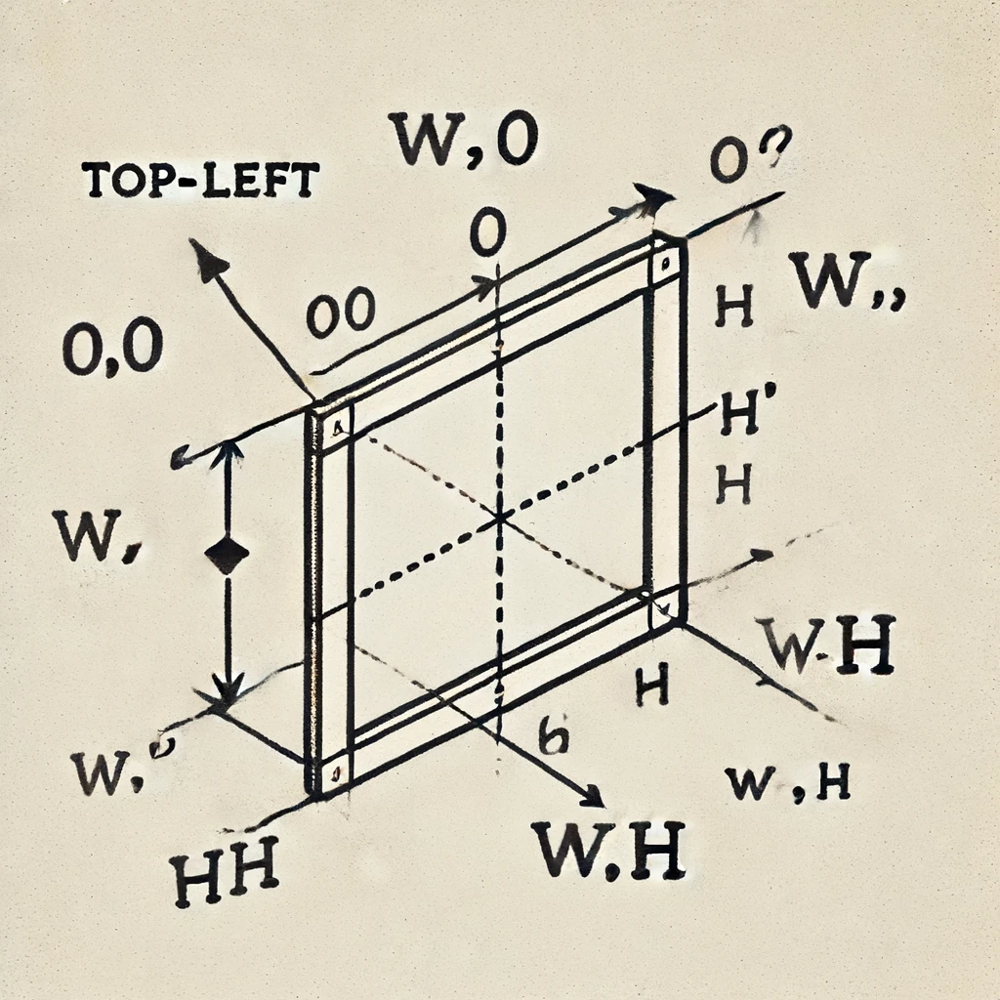

### Code Explanation
from PIL import Image, ImageOps

Importing Modules: We import the Image and ImageOps classes from the Pillow library. Image is used to open and manipulate images, while ImageOps contains various image operations.

code
class Deformer():
    def getmesh(self, img):
        w, h = img.size
        # Define a shape in the original image
        source_shape = (0, 0, 0, h, w, h, w, 0)
        # Define a Rectangle in the original image
        # target_rect = (0,0,w,h) # Four Points are Left, Right, Top, Bottom, In this variable we want to use top left rectangle so this points are being used.
        target_rect = (0, 0, w // 2, h)
        # Return all the Shapes
        return [(target_rect, source_shape)]

Creating a Deformer Class: We define a class called Deformer with a method getmesh.

getmesh(self, img) Method:

Getting Image Size: w, h = img.size gets the width (w) and height (h) of the image.

Defining Source Shape: source_shape = (0, 0, 0, h, w, h, w, 0) defines a quadrilateral shape in the original image, with its corners at the coordinates (0,0), (0,h), (w,h), and (w,0). This essentially covers the whole image.

Defining Target Rectangle: target_rect = (0, 0, w // 2, h) defines a rectangle in the target image. This rectangle covers half the width and the full height of the image.

Returning Shapes: The method returns a list of tuples. Each tuple contains a target rectangle and a source shape. Here, we only have one tuple.

code
image = Image.open('picture.jpg')

Opening the Image: image = Image.open('picture.jpg') opens an image file called 'picture.jpg'. Replace 'picture.jpg' with the path to your image.
python

Code
deform = ImageOps.deform(image, Deformer())
deform.show()

Applying the Deformation:
ImageOps.deform(image, Deformer()) applies the deformation using our Deformer class. This function takes the image and the deformer object and transforms the image based on the mesh provided by the getmesh method.
Displaying the Image: deform.show() displays the transformed image.

What Happens in the Deformation
Source Shape: The source_shape represents the whole original image.
Target Rectangle: The target_rect represents the left half of the image.
Transformation: The ImageOps.deform function maps the entire original image (source_shape) into the left half of the new image (target_rect). This means the image is squished horizontally to fit into the left half of the canvas.

Summary
Deformer Class: Defines how to transform the image.
getmesh Method: Specifies how to map parts of the original image to the new image.
ImageOps.deform: Applies the deformation based on the getmesh mapping.
Result: The image is squeezed into the left half of its original width.
This code demonstrates a basic deformation where the entire image is compressed into a smaller part of the canvas. You can modify the source_shape and target_rect to create different and more complex deformations.

In [52]:
from PIL import Image, ImageOps

class Deformer():
	def getmesh(self,img):
		w,h = img.size
		# # define a shape in the original image 
		# source_shape = (0,0,0,h,w - 1000,h,w,0)
		# # define a rectangle in the new image
		# target_rect = (0,0,w,h) # left,top,right,bottom
		
		left = ((0,0,w // 2, h),(0, 0, 0, h, w // 2, h, w // 2 , 0))
		right = ((w // 2,0,w,h),(w // 2, 0, w // 2, h, 0, h, 0 , 0))
		flip = ((w // 2, 0, w, h ),(w // 2, h, w // 2, 0, w, 0, w - 1000 , h))
        # in above Code block:
        # The first tuple describes a region of the original image
        # The Second Tuple Describes the destination coordinates for that region in the new image
	
        # return all the shapes
		return [left,right]

# image import
image = Image.open('picture.jpg')
deform = ImageOps.deform(image,Deformer())
deform.save('17.png')

# more advanced example: https://www.pythoninformer.com/python-libraries/pillow/imageops-deforming/

Explaination of this code: (PLease Refer to the tutorial on youtube you can understand better with live video explaination)

        left = ((0,0,w // 2, h),(0, 0, 0, h, w // 2, h, w // 2 , 0))
		right = ((w // 2,0,w,h),(w // 2, 0, w // 2, h, 0, h, 0 , 0))
		flip = ((w // 2, 0, w, h ),(w // 2, h, w // 2, 0, w, 0, w - 1000 , h))

Understanding the Deformations:
left:

left = ((0, 0, w // 2, h), (0, 0, 0, h, w // 2, h, w // 2, 0))
Original Region: (0, 0, w // 2, h)
This represents a rectangle in the original image starting from the top-left corner (0, 0) to the midpoint of the width and full height (w // 2, h).
Target Coordinates: (0, 0, 0, h, w // 2, h, w // 2, 0)
These coordinates map the rectangle from the original image directly to the same position in the new image. In this case, the region remains unchanged (no deformation) but it's explicitly specified.

right:

right = ((w // 2, 0, w, h), (w // 2, 0, w // 2, h, 0, h, 0, 0))
Original Region: (w // 2, 0, w, h)
This represents a rectangle in the original image starting from the midpoint of the width and top (w // 2, 0) to the bottom-right corner (w, h).
Target Coordinates: (w // 2, 0, w // 2, h, 0, h, 0, 0)
This maps the right half of the original image to the left half of the new image, effectively flipping it horizontally.

flip:

flip = ((w // 2, 0, w, h), (w // 2, h, w // 2, 0, w, 0, w - 1000, h))
Original Region: (w // 2, 0, w, h)
This again represents the right half of the original image.
Target Coordinates: (w // 2, h, w // 2, 0, w, 0, w - 1000, h)
This set of coordinates does a more complex transformation:
(w // 2, h): Top-left of the original region moves to the bottom-left of the target region.
(w // 2, 0): Bottom-left of the original region moves to the top-left of the target region.
(w, 0): Bottom-right of the original region moves to the top-right of the target region.
(w - 1000, h): Top-right of the original region moves to a point that is 1000 pixels left of the original top-right, at the bottom.

Visualizing the Deformations:
left:
Original left half remains unchanged.
right:
The original right half of the image is flipped horizontally to the left half of the new image.
flip:
The right half undergoes a more complex deformation that involves flipping and moving points.


Summary:
left: Defines a rectangular region on the left half and maps it unchanged.
right: Defines a rectangular region on the right half and flips it horizontally to the left half.
flip: Defines the right half and performs a more complex flipping and shifting.



## Drawing Shapes

Pillow can draw lots of shapes
and you can also draw "text"

In [53]:
from PIL import Image, ImageDraw, ImageFont

image = Image.open('picture.jpg')
draw = ImageDraw.Draw(image) # Creates a Draw Object 

#Drawing some basic shapes
#draw.rectangle((200,400,700,600), fill = 'red', outline = 'yellow', width = 5)
#draw.rectangle((200,400,700,600), fill = (255,0,0), outline = 'yellow', width = 5) # Here we replaced red word with RGB Values you can do this also
draw.ellipse((200,400,700,600), fill = 'red', outline = 'yellow', width = 5)
draw.polygon(((0,0),(100,0),(100,100),(50,200)),fill = 'blue',outline = 'pink')
draw.line(((800,1000),(1000,1100),(1200,1000)),fill = 'black', width = 10, joint = 'curve')

# draw circle thingies
# draw.arc((800,100,1000,300),start = 10, end = 40, width = 10, fill = 'red')
# draw.chord((800,100,1000,300),start = 10, end = 180, width = 10, fill = 'red')
draw.pieslice((800,100,1000,300),start = 10, end = 180, width = 10, fill = 'red')

# draw text 
font = ImageFont.truetype('Halogen.ttf', size = 80)
draw.text((1300,640),'panda', font = font, fill = (0,255,255), align = 'center', anchor = 'rt')

image.show()


# Look this website for Text anchors: https://pillow.readthedocs.io/en/stable/handbook/text-anchors.html

### Merging Images

In [80]:
from PIL import Image, ImageChops #(Chops: Stands for Channel Operations)

# Load the images
panda = Image.open("picture_copy.jpg").convert("RGBA")
owl = Image.open("owl.jpg").convert("RGBA")  #Same size as panda image
python = Image.open("python.png").convert("RGBA")  # smaller than the panda image + has transperancy

# merging images with image.methods()
owl = owl.resize(panda.size)

# Blending images with Image.blend()
image_blend = Image.blend(panda, owl, 0)  #both images need same size and mode We have to provide 3 values Picture 1, Picture 2, and Alpha(it is the range from (0.0,1.0,0.5) Explainantions are given below
# image_composite = Image.composite(panda,owl,Image.new('L',panda.size,50))

# In Above Code:
#Image.new('L',panda.size,50)) (means Image.new('L', panda.size, 50) creates a new grayscale (mode 'L' for luminosity) image with the same size as panda. The value 50 sets the gray level for all pixels in this mask image. This mask controls how the images will be combined:
# 0 (black) means fully transparent (show only the second image, owl).
# 255 (white) means fully opaque (show only the first image, panda).
# Values in between blend the images. Here, 50 is a low value, so the mask is mostly transparent, meaning the owl will be more visible in the composite image.)


# image_composite = Image.composite(panda, owl, Image.new('L', panda.size, 50))
# Image.composite(panda, owl, mask) creates a new image by combining panda and owl according to the mask. 
# Since the mask is mostly transparent, owl will be more prominent in the resulting image, but panda will also be partially visible.

# image paste
panda.paste(python,(100,300), mask = python)

#Channel Operations
image_overlay = ImageChops.overlay(panda,owl) # Overlay Blending mode
image_darker = ImageChops.darker(panda,owl) # Keep darker pixels from both images 
image_lighter = ImageChops.lighter(panda,owl) # Keep lighter pixels from both images
image_soft_light = ImageChops.soft_light(panda,owl) # Soft light blending mode
image_hard_light = ImageChops.hard_light(panda,owl) # Hard light blending mode
image_difference = ImageChops.difference(panda,owl) # subtract pixel values
image_modulo = ImageChops.add_modulo(panda,owl) # Add pixel values modulo
image_screen = ImageChops.screen(panda,owl) # Screen blending mode

# more complex channel operations 
# image_add = ImageChops.add(panda,owl,scale = 2.0,offset = 100) # Combinig the Brightness of each pixel
# image_subtract = ImageChops.subtract(panda,owl,scale = 2.0,offset = 100)
# image_logical_and = ImageChops.logical_and(panda.convert('1'),owl.convert('1'))
# image_logical_or = ImageChops.logical_or(panda.convert('1'),owl.convert('1'))

# super easy 
# image_invert = ImageChops.invert(panda)


# panda.show()



# masking
# mask must have a specfic mode: RGBA, 1 or L
mask = Image.open('mask.png')
# image_masked_alpha = Image.alpha_composite(panda.convert('RGBA'),mask)
image_masked = Image.composite(owl,panda,mask.convert('L'))

mask.convert('L').show()
#image_masked.show()


##### Explaination 

What alpha = 1.0 Means:
alpha = 0.0: The resulting image is entirely the first image (image1).
alpha = 1.0: The resulting image is entirely the second image (image2).
alpha = 0.5: The resulting image is an equal blend of the first and second images.

#### More Explaination of channel operations:

# ImageChops.difference(panda, owl)
What it does: This function compares each pixel in the panda and owl images and calculates the absolute difference between their values.
Explanation: For each pixel, it subtracts the value of the owl pixel from the panda pixel and takes the absolute value of the result. This highlights the areas where the images are different.
Use case: It’s often used to detect changes between two images, such as identifying differences between two frames in a video.
ImageChops.add_modulo(panda, owl)
What it does: This function adds the pixel values of the panda and owl images together, but the result is taken modulo 256.
Explanation: Normally, pixel values range from 0 to 255. When adding the pixel values, if the sum exceeds 255, the modulo 256 operation makes it wrap around (like a clock). For example, if the sum is 260, it becomes 260 % 256 = 4.
Use case: This is used for creative effects where you want to combine pixel values in a way that wraps around at 256, often producing visually interesting results.
ImageChops.screen(panda, owl)
What it does: This function applies the screen blending mode, which is used to lighten images.
Explanation: The screen blending mode inverts both images, multiplies them together, and then inverts the result. 
Use case: Screen blending is often used in photo editing to lighten an image or to blend multiple images together to make them brighter.

#### More Explaination

image_add = ImageChops.add(panda,owl,scale = 2.0,offset = 100) # Combinig the Brightness of each pixel

Add pixel values: For each pixel, add the values from the panda and owl images together.
Scale result: Multiply the resulting sum by the scale factor (2.0 in this case). This enhances the combined brightness effect.
Add offset: Add an offset value (100 here) to each pixel. This helps adjust the overall brightness of the resulting image.
Overall effect: This operation combines the brightness of each pixel from both images, scales the result, and adjusts the brightness, resulting in a brighter composite image.

ImageChops.subtract(panda, owl, scale=2.0, offset=100)

Subtract pixel values: For each pixel, subtract the value of the owl image from the panda image.
Scale result: Multiply the result by the scale factor (2.0 in this case). This can enhance the differences by making them more pronounced.
Add offset: Add an offset value (100 here) to each pixel. This helps in avoiding negative values and can adjust brightness.
Overall effect: This operation can highlight differences between the images and adjust the contrast and brightness of the result.
ImageChops.logical_and(panda.convert('1'), owl.convert('1'))

Convert to binary: Convert both panda and owl images to binary mode ('1'), where each pixel is either black (0) or white (1).
Logical AND: For each pixel, perform a logical AND operation. The result is black if both corresponding pixels in panda and owl are black, otherwise, it's white.
Use case: Useful in creating masks or combining binary images based on common areas.
ImageChops.logical_or(panda.convert('1'), owl.convert('1'))

Convert to binary: Convert both panda and owl images to binary mode ('1'), where each pixel is either black (0) or white (1).
Logical OR: For each pixel, perform a logical OR operation. The result is white if at least one of the corresponding pixels in panda or owl is white, otherwise, it's black.
Use case: Useful in creating masks or combining binary images based on any presence of white pixels.

# Masking

What is Masking?
Masking in image processing is a technique used to hide or reveal parts of an image. A mask is essentially a template that dictates which parts of the image should be visible and which should be hidden. It works like a stencil: wherever the mask allows, the image is visible, and wherever the mask blocks, the image is hidden or replaced.

Types of Masks
RGBA: A mask with Red, Green, Blue, and Alpha (transparency) channels.
1: A binary mask where each pixel is either fully on (white) or fully off (black).
L: A grayscale mask where each pixel can have a value between 0 (black) and 255 (white), allowing for partial transparency.
How to Use Masking
Create or load a mask: The mask image defines the areas of transparency and opacity.
Apply the mask: Use image compositing functions to combine images based on the mask.
Sample Code Explanation
Let’s go through the sample code your instructor gave you:

python
Copy code
#### masking
#### mask must have a specific mode: RGBA, 1 or L
#### mask = Image.open('mask.png')  # Load the mask image

#### Image.alpha_composite() blends two images using the alpha channel for transparency
#### image_masked_alpha = Image.alpha_composite(panda.convert('RGBA'), mask)

#### Image.composite() combines two images using the mask as a template
#### image_masked = Image.composite(owl, panda, mask.convert('L'))
Detailed Explanation
Load the Mask:

python
Copy code
#### mask = Image.open('mask.png')
This line loads an image called mask.png which will be used to control the transparency.
Using Image.alpha_composite:

python
Copy code
#### image_masked_alpha = Image.alpha_composite(panda.convert('RGBA'), mask)
Convert panda to RGBA: panda.convert('RGBA') ensures the panda image has an alpha channel for transparency.
Alpha Composite: Image.alpha_composite(panda.convert('RGBA'), mask) blends the panda image with the mask image using the alpha channel of the mask. This means that the transparency defined in the mask will determine which parts of the panda image are visible.
Using Image.composite:

python
Copy code
#### image_masked = Image.composite(owl, panda, mask.convert('L'))
Convert mask to grayscale (L): mask.convert('L') converts the mask to grayscale mode, where each pixel can have a value between 0 and 255.
Composite Images: Image.composite(owl, panda, mask.convert('L')) combines the owl and panda images using the grayscale mask. In the resulting image:
White areas (255) of the mask show the owl image.
Black areas (0) of the mask show the panda image.
Gray areas blend the two images proportionally based on the mask’s pixel value.
Practical Steps
Create or choose a mask image: This could be an image where white represents areas to be visible and black represents areas to be hidden.
Load your images: The main images you want to combine.
Apply the mask using compositing functions: Use Image.alpha_composite or Image.composite depending on your needs.
Example Code
Here is a full example with comments:

python
Copy code
from PIL import Image, ImageChops

#### Load the images
panda = Image.open("picture_copy.jpg").convert("RGBA")
owl = Image.open("owl.jpg").convert("RGBA")
mask = Image.open("mask.png").convert("L")  # Load mask and convert to grayscale

#### Ensure all images are the same size
owl = owl.resize(panda.size)
mask = mask.resize(panda.size)

#### Use alpha_composite for RGBA images
image_masked_alpha = Image.alpha_composite(panda, owl)  # Blend using alpha channel

#### Use composite with a grayscale mask
image_masked = Image.composite(owl, panda, mask)  # Blend using the mask

#### Save or display the result
image_masked_alpha.show()
image_masked.show()
In this example:

Alpha Composite: Merges panda and owl using their alpha channels.
Composite with Mask: Merges owl and panda based on the grayscale mask, where mask values determine visibility.
This should give you a solid understanding of masking and how to apply it in your projects!

#### Image Restoration: Techniques to restore old or damaged images, such as denoising and deblurring.

Image Restoration: Techniques to restore old or damaged images, such as denoising and deblurring.

Example:

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

# Load the image
image = Image.open('noisy_image.jpg').convert('L')

# Apply Median Filter
denoised_image = image.filter(ImageFilter.MedianFilter(size=3))

# Display the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Noisy Image')
ax[1].imshow(denoised_image, cmap='gray')
ax[1].set_title('Denoised Image')
plt.show()


#### Explanation
Image.open loads the image.

convert('L') converts it to grayscale.

ImageFilter.MedianFilter applies the median filter to reduce noise.


#### In-Depth Explanation of Denoising
Denoising is the process of removing noise from an image. Noise can be thought of as random variations in pixel values, and it can come from various sources, such as sensor noise in digital cameras or compression artifacts. The goal of denoising is to reduce these variations while preserving the important features of the image, such as edges and textures.

Let's dive deeper into how denoising works on a pixel-by-pixel basis using the example of the median filter, which is a simple and effective denoising technique.

Median Filter Denoising

The median filter works by moving a window (a small, typically square neighborhood) over each pixel in the image, replacing the central pixel with the median value of the pixels within the window. This helps to remove noise while preserving edges because the median is less sensitive to outliers (extreme values) than the mean.

How the Median Filter Works
Sliding Window: A window of a specified size (e.g., 3x3, 5x5) slides over each pixel in the image.
Neighborhood: For each position of the window, a neighborhood of pixels is extracted.
Median Calculation: The median value of the pixels in the neighborhood is calculated.
Replace Pixel: The central pixel in the window is replaced with the median value.


##### Let's break this down with an example using a 3x3 window.
[[ 20,  80,  80,  80,  20],

 [ 80,  20, 200,  20,  80],
 
 [ 80, 200, 250, 200,  80],
 
 [ 80,  20, 200,  20,  80],
 
 [ 20,  80,  80,  80,  20]]

We apply a 3x3 median filter. Let's see what happens to the central pixel (200) in the 3x3 neighborhood centered at (2, 2):

Neighborhood: [[ 20,  80,  80],
               [ 80, 200,  20],
               [ 80, 250, 200]]

Sort the values in the neighborhood: [20, 20, 80, 80, 80, 80, 200, 200, 250]
Find the median value: The median is the middle value, which is 80 in this case.
So, the central pixel (200) is replaced with 80.

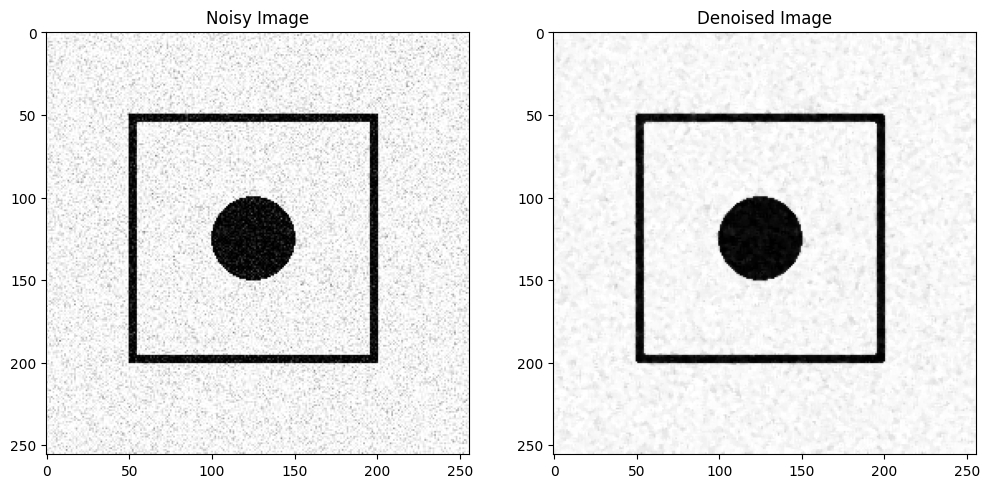

In [5]:
from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt

# Load the noisy image
noisy_image = Image.open('noisy_image.jpg').convert('L')

# Convert to numpy array for custom processing
image_array = np.array(noisy_image)

# Define the median filter function
def median_filter(image_array, filter_size):
    padded_image = np.pad(image_array, pad_width=filter_size//2, mode='edge')
    filtered_image = np.zeros_like(image_array)
    
    for i in range(image_array.shape[0]):
        for j in range(image_array.shape[1]):
            neighborhood = padded_image[i:i+filter_size, j:j+filter_size]
            median_value = np.median(neighborhood)
            filtered_image[i, j] = median_value
    
    return filtered_image

# Apply the median filter
filtered_image_array = median_filter(image_array, 3)

# Convert back to PIL image
filtered_image = Image.fromarray(filtered_image_array)

# Display the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(noisy_image, cmap='gray')
ax[0].set_title('Noisy Image')
ax[1].imshow(filtered_image, cmap='gray')
ax[1].set_title('Denoised Image')
plt.show()


Explanation of Denoising the Image
Load the Noisy Image:

Image.open('noisy_image.jpg').convert('L') loads the noisy image and converts it to grayscale.

Convert to Numpy Array:
image_array = np.array(noisy_image) converts the image to a numpy array for easier manipulation.

Define the Median Filter Function:

np.pad(image_array, pad_width=filter_size//2, mode='edge') pads the image to handle edges.
np.zeros_like(image_array) creates an empty array to store the filtered image.
The nested for loops iterate over each pixel in the image.
neighborhood = padded_image[i:i+filter_size, j:j+filter_size] extracts the neighborhood of the current pixel.
median_value = np.median(neighborhood) calculates the median value of the neighborhood.
filtered_image[i, j] = median_value assigns the median value to the current pixel in the filtered image.

Apply the Median Filter:
filtered_image_array = median_filter(image_array, 3) applies the median filter with a 3x3 window to the noisy image array.

Convert Back to PIL Image:
Image.fromarray(filtered_image_array) converts the filtered numpy array back to a PIL image.

Display the Results:

fig, ax = plt.subplots(1, 2, figsize=(12, 6)) creates a figure with two subplots.
ax[0].imshow(noisy_image, cmap='gray') displays the noisy image in the first subplot.
ax[0].set_title('Noisy Image') sets the title for the first subplot.
ax[1].imshow(filtered_image, cmap='gray') displays the denoised image in the second subplot.
ax[1].set_title('Denoised Image') sets the title for the second subplot.
plt.show() displays the figure with the noisy and denoised images side by side.


Summary
Generate a Noisy Image: Create an image, draw shapes, add Gaussian noise, and save the noisy image.
Denoise the Image: Load the noisy image, apply a median filter, and display the original and denoised images.

## Second Method of Image Restoration:
### Deblurring

Deblurring an Image
Deblurring aims to remove blur from an image, often caused by motion or out-of-focus cameras. While Pillow doesn’t have direct deblurring functions like advanced libraries such as OpenCV, we can use sharpening filters to enhance the details and reduce the appearance of blur.

Understanding Deblurring
Deblurring typically involves complex algorithms that can reverse the effects of blur, but with Pillow, we'll use sharpening filters to improve the image's clarity. Sharpening emphasizes edges and details, making the image appear less blurry.

Code Example: Sharpening an Image
First, let's sharpen a blurry image using Pillow's built-in ImageFilter.SHARPEN.


Deblurring Revisited
Let's ensure we cover all necessary aspects of deblurring before moving on to inpainting.

While Pillow doesn't offer advanced deblurring techniques like deconvolution, we can still use sharpening filters and some custom methods to improve image clarity. However, for a full-fledged deblurring solution, advanced libraries such as OpenCV would be required.

Explanation of the Code
Load the Blurry Image:
Image.open('blurry_image.jpg').convert('L') loads the image and converts it to grayscale.

Apply Sharpen Filter:
image.filter(ImageFilter.SHARPEN) applies a sharpening filter to the image. This filter enhances the edges, making the image appear clearer.

Display the Results:

fig, ax = plt.subplots(1, 2, figsize=(12, 6)) creates a figure with two subplots.
ax[0].imshow(image, cmap='gray') displays the original blurry image.
ax[0].set_title('Blurry Image') sets the title for the first subplot.
ax[1].imshow(sharpened_image, cmap='gray') displays the sharpened image.
ax[1].set_title('Sharpened Image') sets the title for the second subplot.
plt.show() displays the figure.

Summary
Creating a Blurry Image: Load an original image and apply a Gaussian blur.
Sharpening an Image: Load the blurry image and apply a sharpening filter to enhance details.
Display: Use matplotlib to display the original blurry and sharpened images side by side.

In [ ]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

# Step 1: Create a blurry image
def create_blurry_image():
    # Load the original image
    image = Image.open('original_image.jpg').convert('L')
    
    # Apply a Gaussian Blur to create a blurry image
    blurry_image = image.filter(ImageFilter.GaussianBlur(radius=5))
    
    # Save the blurry image
    blurry_image.save('blurry_image.jpg')
    return blurry_image

# Step 2: Load the blurry image and sharpen it
def sharpen_image():
    # Load the blurry image
    blurry_image = Image.open('blurry_image.jpg').convert('L')
    
    # Apply Sharpen Filter
    sharpened_image = blurry_image.filter(ImageFilter.SHARPEN)
    
    # Display the results
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(blurry_image, cmap='gray')
    ax[0].set_title('Blurry Image')
    ax[1].imshow(sharpened_image, cmap='gray')
    ax[1].set_title('Sharpened Image')
    plt.show()

# Create a blurry image and then sharpen it
create_blurry_image()
sharpen_image()


## Second method 
### Inpainting: Filling in missing or damaged parts of an image.

Inpainting
Inpainting is the process of reconstructing lost or deteriorated parts of an image. It's often used to restore old photos, remove watermarks, or fill in missing parts.

Since Pillow does not have advanced inpainting methods, we will use a simple approach to simulate inpainting: filling missing parts of an image using a mask.

Steps for Inpainting
1. Generate a Damaged Image: Create an image with some missing parts.
2. Create a Mask: The mask will indicate which parts of the image are damaged.
3. Apply Inpainting: Fill in the missing parts using a simple color fill or texture.

In [ ]:
from PIL import Image, ImageDraw, ImageChops
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Generate a Damaged Image
def create_damaged_image():
    width, height = 256, 256
    image = Image.new('RGB', (width, height), (255, 255, 255))
    draw = ImageDraw.Draw(image)
    draw.rectangle([(50, 50), (200, 200)], outline=(0, 0, 0), width=5)
    draw.ellipse([(100, 100), (150, 150)], fill=(0, 0, 0))
    draw.rectangle([(70, 70), (90, 90)], fill=(0, 0, 0))
    draw.rectangle([(160, 160), (180, 180)], fill=(0, 0, 0))
    image.save('damaged_image.jpg')
    return image

# Step 2: Create a Mask
def create_mask():
    width, height = 256, 256
    mask = Image.new('L', (width, height), 0)  # Black background
    mask_draw = ImageDraw.Draw(mask)
    mask_draw.rectangle([(70, 70), (90, 90)], fill=255)  # White (damaged area)
    mask_draw.rectangle([(160, 160), (180, 180)], fill=255)  # White (damaged area)
    mask.save('mask.jpg')
    return mask

# Step 3: Apply Inpainting
def apply_inpainting(damaged_image, mask):
    fill_color = (255, 255, 255)  # White color
    fill_image = Image.new('RGB', damaged_image.size, fill_color)
    inpainted_image = Image.composite(fill_image, damaged_image, mask)
    inpainted_image.save('inpainted_image.jpg')
    return inpainted_image

# Generate damaged image and mask
damaged_image = create_damaged_image()
mask = create_mask()

# Apply inpainting
inpainted_image = apply_inpainting(damaged_image, mask)

# Display the results
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(damaged_image)
ax[0].set_title('Damaged Image')
ax[1].imshow(mask, cmap='gray')
ax[1].set_title('Mask')
ax[2].imshow(inpainted_image)
ax[2].set_title('Inpainted Image')
plt.show()


##### Explanation
Generate a Damaged Image:

We create a blank image and draw some shapes on it.
We simulate damage by drawing black rectangles.
Create a Mask:

The mask image highlights the damaged areas with white (255) and the rest with black (0).
Apply Inpainting:

We create a solid color image that will fill the damaged areas.
Image.composite uses the mask to blend the fill image with the damaged image, effectively "inpainting" the damaged areas.

Summary
1. Generate a Damaged Image: Create an image with simulated damage by drawing black rectangles.
2. Create a Mask: Create a mask image where the damaged parts are white and the rest is black.
3. Apply Inpainting: Use the mask to fill the damaged parts with a solid color.

While this is a simplified approach to inpainting, it demonstrates the basic concept. For more advanced inpainting techniques, you might need to explore libraries like OpenCV or use machine learning models specifically designed for image restoration.

Common Types of Image Degradation
Image degradation refers to the loss of image quality due to various factors. Understanding these degradations is crucial in the field of image processing and computer vision as it helps in developing techniques to restore and enhance images. Here are three common types of image degradation:

1. Gaussian Noise

Gaussian noise is a type of statistical noise that follows a normal distribution, often referred to as Gaussian distribution. It appears as random variations in the pixel values of an image.

Characteristics:

Random: The noise values are random but follow a Gaussian (bell-curve) distribution.
Mean and Variance: Typically characterized by its mean (average value) and variance (spread of values).
Example:
Imagine taking a picture in low light conditions with a digital camera. The electronic sensors might produce random variations in pixel values due to thermal noise, resulting in a grainy image.

Mathematical Representation:
If 
I
I is the original image and 
N
N is the Gaussian noise, the degraded image 
I
′
I 
′
  can be represented as:
I
′
=
I
+
N
I 
′
 =I+N
where 
N
N is a Gaussian-distributed random variable with mean 
μ
μ and variance 
σ
2
σ 
2
 .

FOR full Explaination visit this link documents:"https://docs.google.com/document/d/1r7XheNljlQA5f4k4uBLy7ezr4gk8qBtRq8Td-zzUYyU/edit?usp=sharing"

Let's review what we've covered under the topic of image restoration:

Introduction to Image Restoration:

Definition and purpose.
Common techniques: Denoising, Deblurring, and Inpainting.
Denoising:

Explanation of Gaussian noise.
Example of median filtering using Pillow.
Deblurring:

Explanation of motion blur.
Example of sharpening filter using Pillow.
Inpainting:

Explanation of missing pixels.
Example of inpainting using masks and compositing with Pillow.
Ensuring Coverage
We have covered the key aspects of image restoration:

Common types of image degradation.
Techniques and practical implementations for denoising, deblurring, and inpainting using Pillow.
If you feel confident in understanding these topics, we can proceed to the next topic: Geometric Transformations.

Geometric Transformations

Geometric transformations are operations that change the spatial relationships between pixels in an image. These transformations include translation, rotation, scaling, flipping, and more. Understanding these transformations is crucial for various applications in computer vision, such as image alignment, object detection, and image augmentation.

Types of Geometric Transformations
Translation: Moving an image in the x and y directions.
Rotation: Rotating an image around a central point.
Scaling: Resizing an image, either enlarging or shrinking.
Flipping: Mirroring an image across an axis.
Shearing: Distorting an image along an axis.
Implementing Geometric Transformations with Pillow
1. Translation

Translation involves shifting the image by adding a constant value to the x and y coordinates of every pixel.

In [ ]:
from PIL import Image

# Load the image
image = Image.open('original_image.jpg')

# Define translation values
x_shift, y_shift = 50, 30

# Create a new image for the translated output
translated_image = Image.new('RGB', (image.width + x_shift, image.height + y_shift), (255, 255, 255))

# Paste the original image at the new location
translated_image.paste(image, (x_shift, y_shift))

# Save and show the translated image
translated_image.save('translated_image.jpg')
translated_image.show()


In [ ]:
# 2. Rotation
# Rotation involves rotating the image by a specified angle around its center.

from PIL import Image

# Load the image
image = Image.open('original_image.jpg')

# Rotate the image by 45 degrees
rotated_image = image.rotate(45, expand=True)

# Save and show the rotated image
rotated_image.save('rotated_image.jpg')
rotated_image.show()


In [ ]:
# 3. Scaling
# Scaling involves resizing the image by a specified factor.

from PIL import Image

# Load the image
image = Image.open('original_image.jpg')

# Scale the image by a factor of 0.5 (reduce size)
scaled_image = image.resize((int(image.width * 0.5), int(image.height * 0.5)))

# Save and show the scaled image
scaled_image.save('scaled_image.jpg')
scaled_image.show()


In [ ]:
# 4. Flipping
# Flipping involves mirroring the image across a specified axis (horizontal or vertical).

from PIL import Image

# Load the image
image = Image.open('original_image.jpg')

# Flip the image horizontally
flipped_image = image.transpose(Image.FLIP_LEFT_RIGHT)

# Save and show the flipped image
flipped_image.save('flipped_image.jpg')
flipped_image.show()


In [ ]:
# 5. Shearing
# Shearing involves distorting the image along an axis. Pillow does not directly support shearing, so we can achieve it using an affine transformation.

from PIL import Image, ImageTransform

# Load the image
image = Image.open('original_image.jpg')

# Define a shearing transformation (shear in x-direction)
shear_x = 0.2
shear_transform = ImageTransform.AffineTransform((1, shear_x, 0, 0, 1, 0))

# Apply the shearing transformation
sheared_image = image.transform(image.size, Image.AFFINE, shear_transform.data)

# Save and show the sheared image
sheared_image.save('sheared_image.jpg')
sheared_image.show()


Summary of Geometric Transformations
Translation: Moving the image in x and y directions.

Rotation: Rotating the image by a specified angle.

Scaling: Resizing the image.

Flipping: Mirroring the image.

Shearing: Distorting the image along an axis.

By understanding and implementing these geometric transformations, you can manipulate images in various ways to suit different applications in computer vision and image processing. Feel free to experiment with these transformations to get a deeper understanding of how they work. If you have any questions or need further clarification, don't hesitate to ask!

Review of Geometric Transformations
Let's review what we've covered under the topic of geometric transformations:

Introduction to Geometric Transformations:

Definition and purpose.
Importance in computer vision.
Types of Geometric Transformations:

Translation
Rotation
Scaling
Flipping
Shearing
Implementations with Pillow:

Provided code examples for each type of transformation:
Translation
Rotation
Scaling
Flipping
Shearing (using affine transformations)
Ensuring Coverage
We have covered the key aspects of geometric transformations:

Definitions and use cases.
Practical implementations using Pillow.
If you feel confident in understanding these topics, we can proceed to the next topic: Edge Detection.

## Edge Detection

Edge detection is a fundamental image processing technique used to identify the boundaries or edges within an image. These edges often represent significant changes in intensity or color and are crucial for understanding the structure and features within the image.

Importance of Edge Detection
Feature Extraction: Identifying edges helps in detecting objects, shapes, and structures within an image.
Image Segmentation: Edges can be used to divide an image into meaningful regions.
Pattern Recognition: Essential for recognizing patterns and making sense of the visual content.
Common Edge Detection Techniques
Sobel Operator
Prewitt Operator
Canny Edge Detector
Implementing Edge Detection with Pillow
Pillow doesn't directly support advanced edge detection methods like OpenCV, but we can use the built-in filters and custom implementations to achieve edge detection.

In [ ]:
# 1. Sobel Operator
# The Sobel operator calculates the gradient of the image intensity at each pixel, highlighting regions of high spatial frequency that correspond to edges.

from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = Image.open('original_image.jpg').convert('L')

# Define Sobel kernels
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

# Apply Sobel filter
sobel_x_image = image.filter(ImageFilter.Kernel((3, 3), sobel_x.flatten(), scale=1))
sobel_y_image = image.filter(ImageFilter.Kernel((3, 3), sobel_y.flatten(), scale=1))

# Combine the two images
sobel_combined = np.hypot(np.array(sobel_x_image), np.array(sobel_y_image))
sobel_combined = np.clip(sobel_combined, 0, 255).astype(np.uint8)

# Convert back to PIL image
sobel_image = Image.fromarray(sobel_combined)

# Display the results
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(sobel_x_image, cmap='gray')
ax[1].set_title('Sobel X')
ax[2].imshow(sobel_y_image, cmap='gray')
ax[2].set_title('Sobel Y')
ax[3].imshow(sobel_image, cmap='gray')
ax[3].set_title('Sobel Combined')
plt.show()


 Explanation
Load the Image:

Image.open('original_image.jpg').convert('L') loads and converts the image to grayscale.
Define Sobel Kernels:

Sobel operators for detecting horizontal and vertical edges.
Apply Sobel Filter:

Use ImageFilter.Kernel to apply the Sobel filters.
Combine Results:

Combine the horizontal and vertical edges using the hypotenuse function (np.hypot).
Display Results:

Display the original, horizontal edges, vertical edges, and combined edge images.

In [ ]:
# 2. Prewitt Operator
# The Prewitt operator is similar to the Sobel operator but uses a different kernel for calculating the gradients.

from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = Image.open('original_image.jpg').convert('L')

# Define Prewitt kernels
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

# Apply Prewitt filter
prewitt_x_image = image.filter(ImageFilter.Kernel((3, 3), prewitt_x.flatten(), scale=1))
prewitt_y_image = image.filter(ImageFilter.Kernel((3, 3), prewitt_y.flatten(), scale=1))

# Combine the two images
prewitt_combined = np.hypot(np.array(prewitt_x_image), np.array(prewitt_y_image))
prewitt_combined = np.clip(prewitt_combined, 0, 255).astype(np.uint8)

# Convert back to PIL image
prewitt_image = Image.fromarray(prewitt_combined)

# Display the results
fig, ax = plt.subplots(1, 4, figsize=(20, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(prewitt_x_image, cmap='gray')
ax[1].set_title('Prewitt X')
ax[2].imshow(prewitt_y_image, cmap='gray')
ax[2].set_title('Prewitt Y')
ax[3].imshow(prewitt_image, cmap='gray')
ax[3].set_title('Prewitt Combined')
plt.show()


Explanation
Load the Image:

Load and convert the image to grayscale.
Define Prewitt Kernels:

Prewitt operators for detecting horizontal and vertical edges.
Apply Prewitt Filter:

Use ImageFilter.Kernel to apply the Prewitt filters.
Combine Results:

Combine the horizontal and vertical edges using the hypotenuse function (np.hypot).
Display Results:

Display the original, horizontal edges, vertical edges, and combined edge images.

In [ ]:
# 3. Canny Edge Detector
# The Canny edge detector is a more advanced method for edge detection. While Pillow does not support Canny directly, we can use OpenCV for this example.

import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('original_image.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Canny edge detector
edges = cv2.Canny(image, 100, 200)

# Convert to PIL image
edges_pil = Image.fromarray(edges)

# Display the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(edges_pil, cmap='gray')
ax[1].set_title('Canny Edges')
plt.show()


Explanation
Load the Image:

Use OpenCV to load the image in grayscale.
Apply Canny Edge Detector:

Use cv2.Canny to apply the Canny edge detection algorithm.
Convert to PIL Image:

Convert the resulting edges to a PIL image for display.
Display Results:

Display the original image and the edges detected by the Canny algorithm.
Summary of Edge Detection
Sobel Operator: Detects edges by calculating the gradient of the image intensity.
Prewitt Operator: Similar to Sobel, but uses a different kernel.
Canny Edge Detector: A more advanced method that detects a wide range of edges with less noise.
By understanding and implementing these edge detection techniques, you can identify important features and structures within an image. 
This is crucial for various applications in computer vision, such as object detection, image segmentation, and pattern recognition. 
Feel free to experiment with these techniques to get a deeper understanding of how they work. 
If you have any questions or need further clarification, don't hesitate to ask!

Review of Edge Detection
Let's review what we've covered under the topic of edge detection:

Introduction to Edge Detection:

Definition and purpose.
Importance in image processing and computer vision.
Common Edge Detection Techniques:

Sobel Operator: Detailed implementation with code.
Prewitt Operator: Detailed implementation with code.
Canny Edge Detector: Implementation using OpenCV.
Ensuring Coverage
We have covered the key aspects of edge detection:

Definitions and use cases.
Practical implementations using Pillow and OpenCV for various edge detection techniques.

## Image Segmentation
Image segmentation is the process of partitioning an image into multiple segments (sets of pixels) to simplify its representation and make it more meaningful and easier to analyze. It’s used to locate objects and boundaries in images. The goal of segmentation is to assign a label to every pixel in an image such that pixels with the same label share certain characteristics.

Importance of Image Segmentation
Object Detection: Identifying and locating objects within an image.
Image Analysis: Simplifying image representation for easier analysis.
Medical Imaging: Identifying regions of interest such as tumors or organs.
Common Image Segmentation Techniques
Thresholding
Region-Based Segmentation
Edge-Based Segmentation
Cluster-Based Segmentation (K-means)
Implementing Image Segmentation with Pillow and OpenCV

In [ ]:
# 1. Thresholding
# Thresholding is a simple method that converts an image into a binary image based on a threshold value.

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = Image.open('original_image.jpg').convert('L')

# Convert to numpy array
image_array = np.array(image)

# Apply global thresholding
threshold = 128
binary_image = image_array > threshold

# Convert back to PIL image
binary_image = Image.fromarray(binary_image.astype(np.uint8) * 255)

# Display the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[1].imshow(binary_image, cmap='gray')
ax[1].set_title('Binary Image')
plt.show()
